In [1]:
from __future__ import print_function, division
import torch
import torch
import torch.nn as nn
import torch.optim as optim
import data0413 as dt
import model_ResU as md
import copy
from torch.utils.data import DataLoader, ConcatDataset
import torchvision.transforms as transforms
from pytorch_ssim import ssim
import pytorch_edgeloss
# ResU

In [2]:
# print gpu
torch.cuda.set_device(0)
currentDevice = torch.cuda.current_device()
print("Current GPU: " + str(currentDevice))
print(str(torch.cuda.device_count()))
print(str(torch.cuda.get_device_capability(currentDevice)))
print(torch.__version__)
USE_GPU = 1
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = "cpu"
print(device)

Current GPU: 0
8
(7, 0)
1.0.0
cuda:0


In [3]:
# generate csv file, run only for the first time
import csvgenerator as csvg
# csvg.generate_csv()

In [3]:
csvFilePath = dt.get_csv_path()
print(csvFilePath)
transformed_dataset = dt.HE_SHG_Dataset(csv_file=csvFilePath,
                                               transform=dt.Compose([                                              
                                               dt.Rescale(96),                                     
                                               dt.Normalize(),
                                               dt.ToTensor()
                                           ]))
# TODO: change the normalization parameters

/deepdata/adib/HEtoSHG/cs766/Data/image_files.csv


In [4]:
# batchsize 32->16
dataloader = DataLoader(transformed_dataset, batch_size=40,
                        shuffle=True, num_workers=0)
print(len(transformed_dataset))

1004324


0 torch.Size([40, 3, 96, 96]) torch.Size([40, 96, 96])
1 torch.Size([40, 3, 96, 96]) torch.Size([40, 96, 96])
2 torch.Size([40, 3, 96, 96]) torch.Size([40, 96, 96])
3 torch.Size([40, 3, 96, 96]) torch.Size([40, 96, 96])
torch.Size([40, 1, 96, 96])


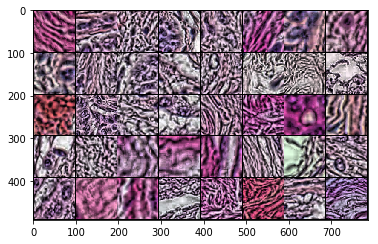

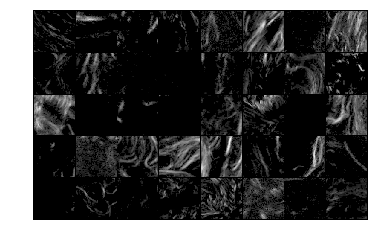

In [5]:
# TODO: insert back mean and variance to plot the image appropriately
dt.show_patch(dataloader) 

In [6]:
import os
cwd = os.getcwd();
path = os.path.join(cwd, 'Saved model', 'ResU_0413.pth')
model = md.Net()
model.load_state_dict(torch.load(path))
model.eval()

Net(
  (block): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1)
  )
  (block0): ResBlock(
    (side): Sequential(
      (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(2, 2))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.1)
    )
    (conv_1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.1)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.1)
    )
    (conv_2): Sequential(
      (0): Conv2d(64, 64, kernel_size=(1, 1),

In [7]:
model = model.to(device)

In [6]:
model = md.Net().to(device)

In [8]:
criterionMSE = nn.MSELoss()
criterionMSE = criterionMSE.cuda()
criterionEdge = pytorch_edgeloss.EDGE()
criterionEdge = criterionEdge.cuda()
criterionL1 = nn.L1Loss()
criterionL1 = criterionL1.cuda()
def trainMS(epoch, p, windowsize):
    epoch_loss = 0
    for iteration, batch in enumerate(dataloader):
        input, target = batch['input'].to(device), batch['output'].to(device)

        optimizer.zero_grad()
        output = model(input)
        targetf = target.float()
        targetf = targetf[:, None]
        
        lossMSE = criterionMSE(output, targetf)  
#         lossMSE = criterionEdge(output, targetf)
        lossSSIM = 1-ssim(output, targetf, windowsize)
        lossMSE = criterionL1(output, targetf)
#         lossSSIM = criterionEdge(output, targetf)
        
        # 0.75->0.4 after 3 epochs
        loss = p*lossMSE + (1-p)*lossSSIM
        combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
        
        epoch_loss = epoch_loss + combineLoss
        loss.backward()
        optimizer.step()
    
        if iteration%50 == 0:
            print("lossL1: " + str(lossMSE.item()) +
                  " " + "lossSSIM: " + str(lossSSIM.item()))
            print("===> Epoch[{}]({}/{}): Loss: {:.4f}".format(epoch, iteration, len(dataloader), loss.item()))

    print("===> Epoch {} Complete: Avg. Loss: {:.4f}".format(epoch, epoch_loss / len(dataloader)))

In [11]:
import matplotlib.pyplot as plt
from torchvision import transforms, utils
def test():
    avg_psnr = 0
    with torch.no_grad():
        for iteration, batch in enumerate(dataloader):
            input, target = batch['input'].to(device), batch['output'].to(device)
                
            prediction = model(input)

            target = target.float()

            outdataloader = {'input':prediction,'output':target}
            
            print(outdataloader['input'].size(), 
                      outdataloader['output'].size())

            plt.figure()
            input_batch, label_batch = outdataloader['input'], outdataloader['output']
            
            input = input[0:32, :, :, :]
            input_batch = input_batch[0:32, :, :, :]
            label_batch = label_batch[0:32, :, :]
            
            batch_size = 32
            im_size = input_batch.size(2)
            label_batch=label_batch.reshape([batch_size,1,im_size,im_size])
            print(label_batch.size())
#             for img in input_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)
                            
#             for img in label_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)                           
            grid = utils.make_grid(input).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()
    
            grid = utils.make_grid(input_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()

            grid = utils.make_grid(label_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))

            plt.axis('off')
            plt.ioff()
            plt.show()
            
#             targetf = target[:, None]
            
#             lossMSE = criterionL(prediction, targetf)      
#             lossSSIM = -ssim(prediction, targetf)
        
#             p = 0.25
#             loss = p*lossMSE + (1-p)*lossSSIM
#             combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
# #             mse = criterion(prediction, target.float())

#             psnr = 10 * torch.log10(1 / loss)
#             avg_psnr += psnr
            if iteration == 16:
                break
#     print("===> Avg. PSNR: {:.4f} dB".format(avg_psnr / len(dataloader)))

In [14]:
import os
cwd = os.getcwd();
path = os.path.join(cwd, 'Saved model', 'ResU_0413.pth')
torch.save(model.state_dict(), path)

In [ ]:
test()

In [9]:
l = 0.001
p = 0.75
windowsize = 11
for epoch in range(1, 200 + 1):
    if epoch%5 == 0:
        windowsize = windowsize+1
        p = p*1
        l = l*1
        if windowsize >= 11:
            windowsze = 11
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    trainMS(epoch, p, windowsize)

lossL1: 0.42054909467697144 lossSSIM: 0.966376543045044
===> Epoch[1](0/25109): Loss: 0.5570
lossL1: 0.372018039226532 lossSSIM: 0.806674063205719
===> Epoch[1](50/25109): Loss: 0.4807
lossL1: 0.3801720142364502 lossSSIM: 0.8124728202819824
===> Epoch[1](100/25109): Loss: 0.4882
lossL1: 0.35720914602279663 lossSSIM: 0.795175313949585
===> Epoch[1](150/25109): Loss: 0.4667
lossL1: 0.3938743472099304 lossSSIM: 0.7996660470962524
===> Epoch[1](200/25109): Loss: 0.4953
lossL1: 0.38130882382392883 lossSSIM: 0.7831987142562866
===> Epoch[1](250/25109): Loss: 0.4818
lossL1: 0.371923565864563 lossSSIM: 0.7785475254058838
===> Epoch[1](300/25109): Loss: 0.4736
lossL1: 0.3449258804321289 lossSSIM: 0.7997432947158813
===> Epoch[1](350/25109): Loss: 0.4586
lossL1: 0.3723489046096802 lossSSIM: 0.7849302887916565
===> Epoch[1](400/25109): Loss: 0.4755
lossL1: 0.3835687041282654 lossSSIM: 0.798263430595398
===> Epoch[1](450/25109): Loss: 0.4872
lossL1: 0.3532751798629761 lossSSIM: 0.7975798845291138


lossL1: 0.27566349506378174 lossSSIM: 0.7158703804016113
===> Epoch[1](4300/25109): Loss: 0.3857
lossL1: 0.27832847833633423 lossSSIM: 0.7117428779602051
===> Epoch[1](4350/25109): Loss: 0.3867
lossL1: 0.2739524245262146 lossSSIM: 0.7286352515220642
===> Epoch[1](4400/25109): Loss: 0.3876
lossL1: 0.285167396068573 lossSSIM: 0.7244994640350342
===> Epoch[1](4450/25109): Loss: 0.3950
lossL1: 0.2781359851360321 lossSSIM: 0.7074955701828003
===> Epoch[1](4500/25109): Loss: 0.3855
lossL1: 0.25810953974723816 lossSSIM: 0.7352567911148071
===> Epoch[1](4550/25109): Loss: 0.3774
lossL1: 0.2893036901950836 lossSSIM: 0.7510862350463867
===> Epoch[1](4600/25109): Loss: 0.4047
lossL1: 0.25696930289268494 lossSSIM: 0.714462399482727
===> Epoch[1](4650/25109): Loss: 0.3713
lossL1: 0.2808498442173004 lossSSIM: 0.7166231870651245
===> Epoch[1](4700/25109): Loss: 0.3898
lossL1: 0.26803305745124817 lossSSIM: 0.7599367499351501
===> Epoch[1](4750/25109): Loss: 0.3910
lossL1: 0.27545231580734253 lossSSIM:

lossL1: 0.1946239471435547 lossSSIM: 0.6409753561019897
===> Epoch[1](8550/25109): Loss: 0.3062
lossL1: 0.19858703017234802 lossSSIM: 0.6559503078460693
===> Epoch[1](8600/25109): Loss: 0.3129
lossL1: 0.19854789972305298 lossSSIM: 0.6526762247085571
===> Epoch[1](8650/25109): Loss: 0.3121
lossL1: 0.19489623606204987 lossSSIM: 0.6475628614425659
===> Epoch[1](8700/25109): Loss: 0.3081
lossL1: 0.18699300289154053 lossSSIM: 0.6563467979431152
===> Epoch[1](8750/25109): Loss: 0.3043
lossL1: 0.19940587878227234 lossSSIM: 0.6563574075698853
===> Epoch[1](8800/25109): Loss: 0.3136
lossL1: 0.19090266525745392 lossSSIM: 0.6434565186500549
===> Epoch[1](8850/25109): Loss: 0.3040
lossL1: 0.18182292580604553 lossSSIM: 0.6497080326080322
===> Epoch[1](8900/25109): Loss: 0.2988
lossL1: 0.19196893274784088 lossSSIM: 0.6234022378921509
===> Epoch[1](8950/25109): Loss: 0.2998
lossL1: 0.18932458758354187 lossSSIM: 0.6367424726486206
===> Epoch[1](9000/25109): Loss: 0.3012
lossL1: 0.18529149889945984 los

lossL1: 0.13116222620010376 lossSSIM: 0.5675976276397705
===> Epoch[1](12800/25109): Loss: 0.2403
lossL1: 0.12692658603191376 lossSSIM: 0.563574492931366
===> Epoch[1](12850/25109): Loss: 0.2361
lossL1: 0.12860986590385437 lossSSIM: 0.559212863445282
===> Epoch[1](12900/25109): Loss: 0.2363
lossL1: 0.13323479890823364 lossSSIM: 0.5391102433204651
===> Epoch[1](12950/25109): Loss: 0.2347
lossL1: 0.13010433316230774 lossSSIM: 0.6010581254959106
===> Epoch[1](13000/25109): Loss: 0.2478
lossL1: 0.12868328392505646 lossSSIM: 0.5810309052467346
===> Epoch[1](13050/25109): Loss: 0.2418
lossL1: 0.13477882742881775 lossSSIM: 0.591539740562439
===> Epoch[1](13100/25109): Loss: 0.2490
lossL1: 0.12065569311380386 lossSSIM: 0.5764163732528687
===> Epoch[1](13150/25109): Loss: 0.2346
lossL1: 0.13064654171466827 lossSSIM: 0.5326029062271118
===> Epoch[1](13200/25109): Loss: 0.2311
lossL1: 0.12669923901557922 lossSSIM: 0.5467147827148438
===> Epoch[1](13250/25109): Loss: 0.2317
lossL1: 0.1273745894432

lossL1: 0.08608366549015045 lossSSIM: 0.5009458661079407
===> Epoch[1](17000/25109): Loss: 0.1898
lossL1: 0.0838836282491684 lossSSIM: 0.48396384716033936
===> Epoch[1](17050/25109): Loss: 0.1839
lossL1: 0.07995283603668213 lossSSIM: 0.5196079015731812
===> Epoch[1](17100/25109): Loss: 0.1899
lossL1: 0.07485233247280121 lossSSIM: 0.462043821811676
===> Epoch[1](17150/25109): Loss: 0.1717
lossL1: 0.08324344456195831 lossSSIM: 0.4431290626525879
===> Epoch[1](17200/25109): Loss: 0.1732
lossL1: 0.08112085610628128 lossSSIM: 0.46236270666122437
===> Epoch[1](17250/25109): Loss: 0.1764
lossL1: 0.08214446902275085 lossSSIM: 0.5154600143432617
===> Epoch[1](17300/25109): Loss: 0.1905
lossL1: 0.07863124459981918 lossSSIM: 0.5115342140197754
===> Epoch[1](17350/25109): Loss: 0.1869
lossL1: 0.07485926896333694 lossSSIM: 0.47287631034851074
===> Epoch[1](17400/25109): Loss: 0.1744
lossL1: 0.08499458432197571 lossSSIM: 0.5573887825012207
===> Epoch[1](17450/25109): Loss: 0.2031
lossL1: 0.084051363

lossL1: 0.061800867319107056 lossSSIM: 0.4522339701652527
===> Epoch[1](21200/25109): Loss: 0.1594
lossL1: 0.07371512055397034 lossSSIM: 0.5525151491165161
===> Epoch[1](21250/25109): Loss: 0.1934
lossL1: 0.06055942177772522 lossSSIM: 0.43558794260025024
===> Epoch[1](21300/25109): Loss: 0.1543
lossL1: 0.06898064911365509 lossSSIM: 0.49808281660079956
===> Epoch[1](21350/25109): Loss: 0.1763
lossL1: 0.057779185473918915 lossSSIM: 0.40114980936050415
===> Epoch[1](21400/25109): Loss: 0.1436
lossL1: 0.05270714312791824 lossSSIM: 0.3942124843597412
===> Epoch[1](21450/25109): Loss: 0.1381
lossL1: 0.059207744896411896 lossSSIM: 0.45215004682540894
===> Epoch[1](21500/25109): Loss: 0.1574
lossL1: 0.055942945182323456 lossSSIM: 0.3701920509338379
===> Epoch[1](21550/25109): Loss: 0.1345
lossL1: 0.06571707129478455 lossSSIM: 0.44493722915649414
===> Epoch[1](21600/25109): Loss: 0.1605
lossL1: 0.06521148234605789 lossSSIM: 0.47886091470718384
===> Epoch[1](21650/25109): Loss: 0.1686
lossL1: 0.

lossL1: 0.057453453540802 lossSSIM: 0.4413578510284424
===> Epoch[2](200/25109): Loss: 0.1534
lossL1: 0.08037997037172318 lossSSIM: 0.5339107513427734
===> Epoch[2](250/25109): Loss: 0.1938
lossL1: 0.07564063370227814 lossSSIM: 0.4897651672363281
===> Epoch[2](300/25109): Loss: 0.1792
lossL1: 0.04771941527724266 lossSSIM: 0.4095913767814636
===> Epoch[2](350/25109): Loss: 0.1382
lossL1: 0.06169397011399269 lossSSIM: 0.4542360305786133
===> Epoch[2](400/25109): Loss: 0.1598
lossL1: 0.05661663040518761 lossSSIM: 0.4280439615249634
===> Epoch[2](450/25109): Loss: 0.1495
lossL1: 0.06505713611841202 lossSSIM: 0.480959951877594
===> Epoch[2](500/25109): Loss: 0.1690
lossL1: 0.05724700912833214 lossSSIM: 0.44567567110061646
===> Epoch[2](550/25109): Loss: 0.1544
lossL1: 0.061769500374794006 lossSSIM: 0.4895944595336914
===> Epoch[2](600/25109): Loss: 0.1687
lossL1: 0.05070829391479492 lossSSIM: 0.4093089699745178
===> Epoch[2](650/25109): Loss: 0.1404
lossL1: 0.06119336187839508 lossSSIM: 0.4

KeyboardInterrupt: 

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


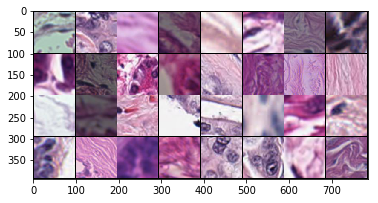

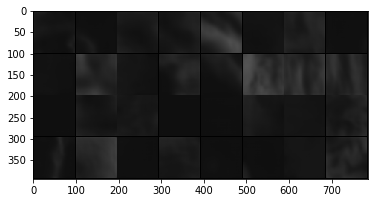

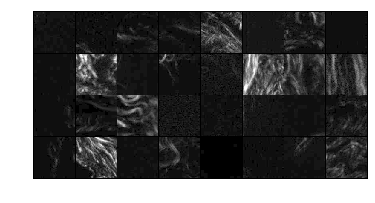

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


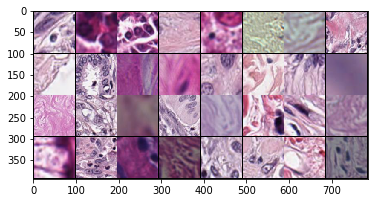

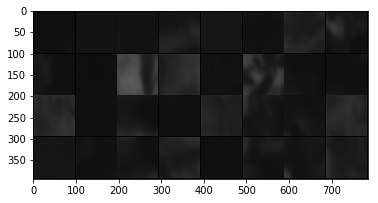

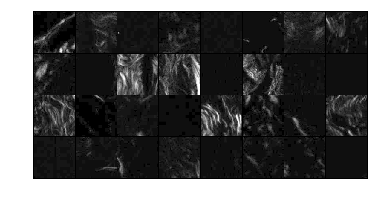

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


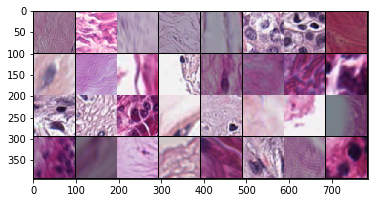

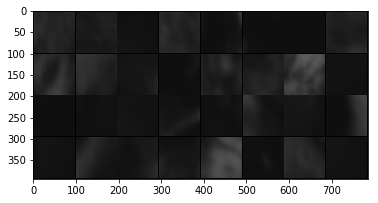

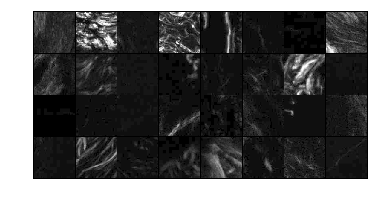

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


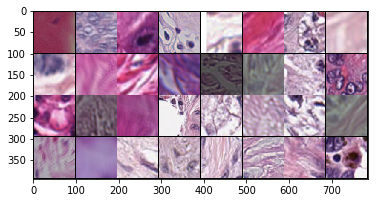

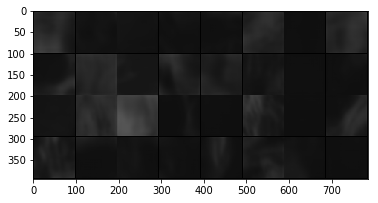

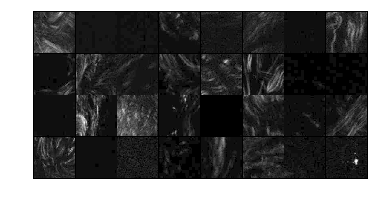

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


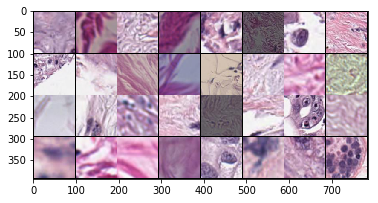

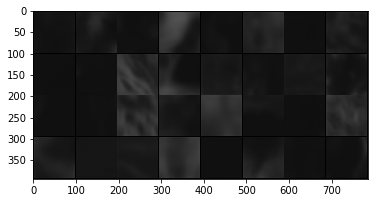

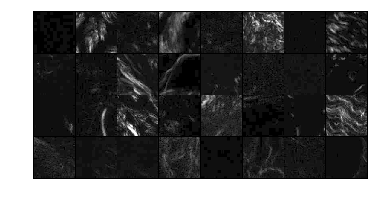

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


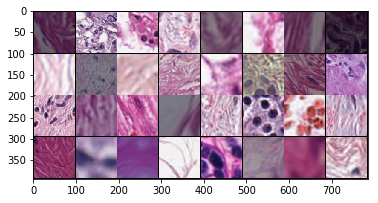

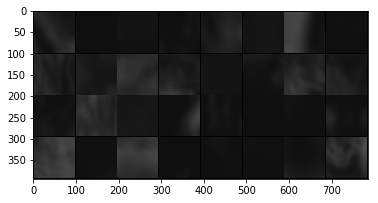

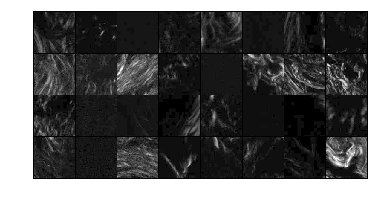

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


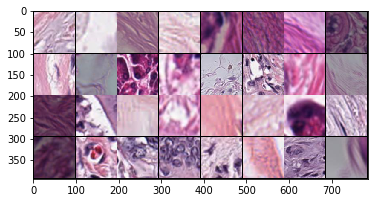

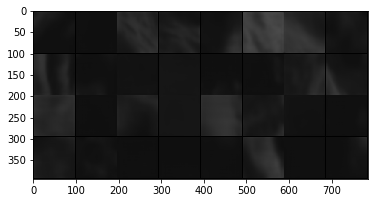

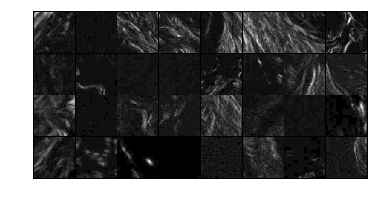

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


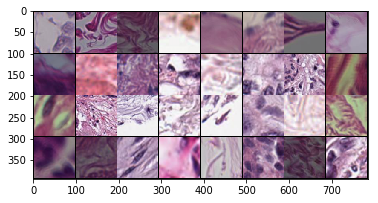

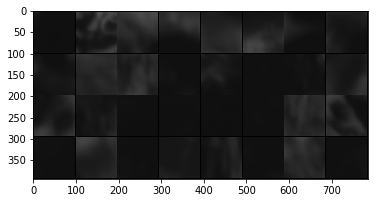

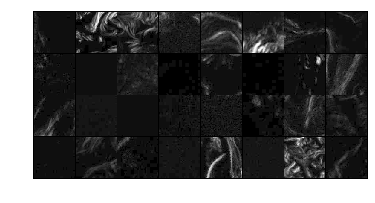

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


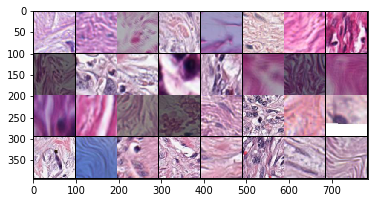

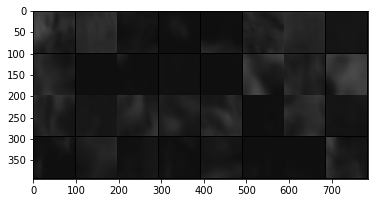

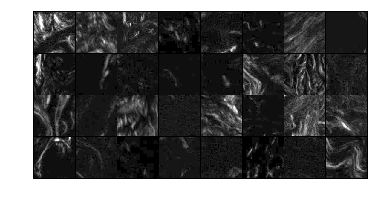

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


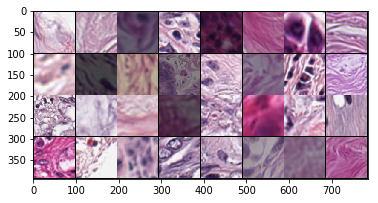

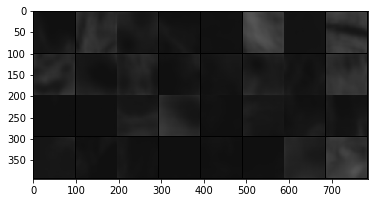

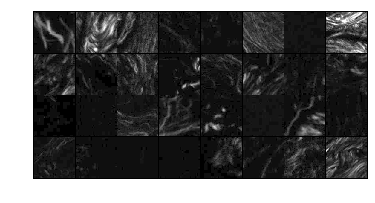

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


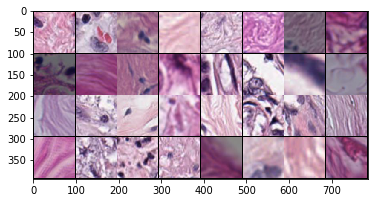

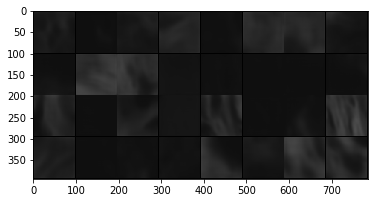

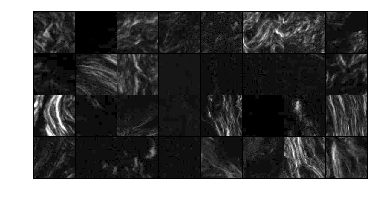

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


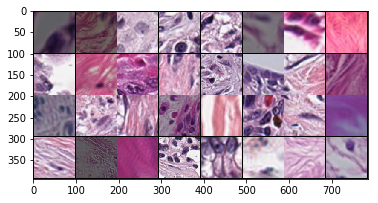

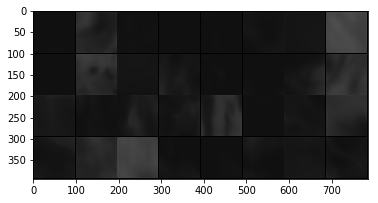

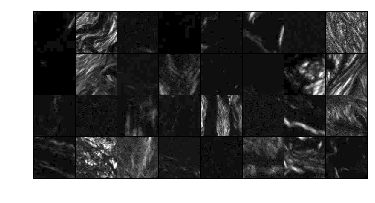

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


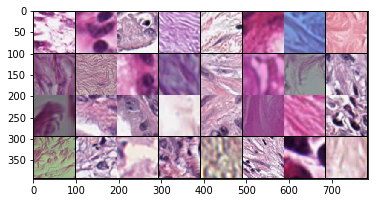

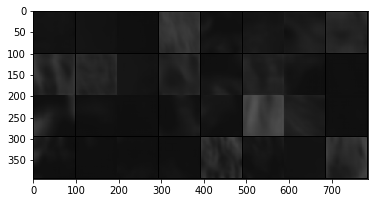

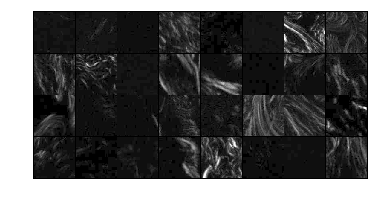

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


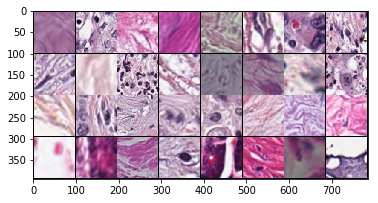

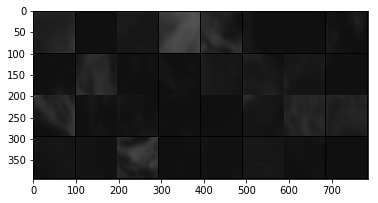

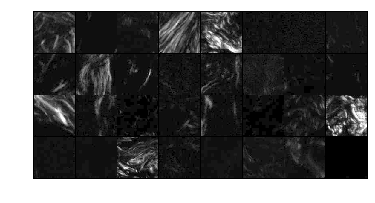

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


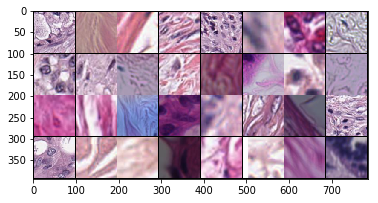

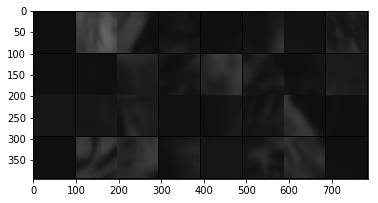

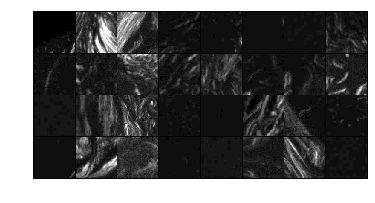

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


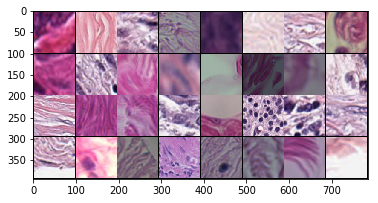

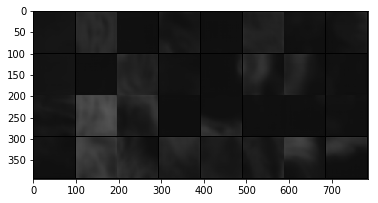

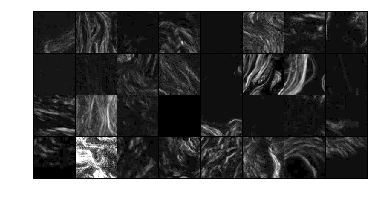

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


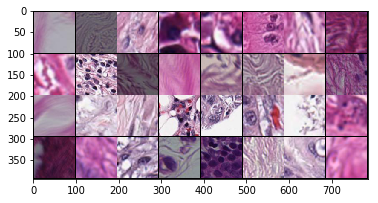

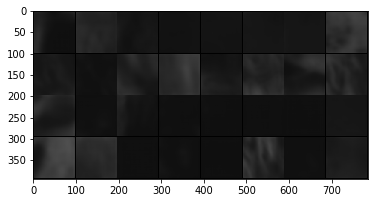

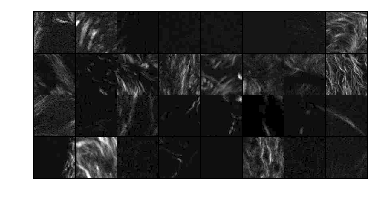

In [10]:
test()

In [9]:
l = 0.001
p = 0.75
windowsize = 11
for epoch in range(1, 200 + 1):
    if epoch%5 == 0:
        windowsize = windowsize+1
        p = p*1
        l = l*1
        if windowsize >= 11:
            windowsze = 11
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    trainMS(epoch, p, windowsize)

lossL1: 0.11043448746204376 lossSSIM: 0.9346655011177063
===> Epoch[1](0/25109): Loss: 0.3165
lossL1: 0.09423831105232239 lossSSIM: 0.5584105253219604
===> Epoch[1](50/25109): Loss: 0.2103
lossL1: 0.06844586133956909 lossSSIM: 0.4523769021034241
===> Epoch[1](100/25109): Loss: 0.1644
lossL1: 0.11239973455667496 lossSSIM: 0.5747878551483154
===> Epoch[1](150/25109): Loss: 0.2280
lossL1: 0.09342329949140549 lossSSIM: 0.5253863334655762
===> Epoch[1](200/25109): Loss: 0.2014
lossL1: 0.10509946942329407 lossSSIM: 0.482003390789032
===> Epoch[1](250/25109): Loss: 0.1993
lossL1: 0.08234492689371109 lossSSIM: 0.526150643825531
===> Epoch[1](300/25109): Loss: 0.1933
lossL1: 0.10875920951366425 lossSSIM: 0.5661112070083618
===> Epoch[1](350/25109): Loss: 0.2231
lossL1: 0.08283399790525436 lossSSIM: 0.41058385372161865
===> Epoch[1](400/25109): Loss: 0.1648
lossL1: 0.08169324696063995 lossSSIM: 0.44131898880004883
===> Epoch[1](450/25109): Loss: 0.1716
lossL1: 0.11759516596794128 lossSSIM: 0.626

lossL1: 0.11589009314775467 lossSSIM: 0.5403763055801392
===> Epoch[1](4250/25109): Loss: 0.2220
lossL1: 0.10437969863414764 lossSSIM: 0.5409382581710815
===> Epoch[1](4300/25109): Loss: 0.2135
lossL1: 0.09670917689800262 lossSSIM: 0.555091142654419
===> Epoch[1](4350/25109): Loss: 0.2113
lossL1: 0.10971581190824509 lossSSIM: 0.576650857925415
===> Epoch[1](4400/25109): Loss: 0.2264
lossL1: 0.08853517472743988 lossSSIM: 0.46427416801452637
===> Epoch[1](4450/25109): Loss: 0.1825
lossL1: 0.09595710039138794 lossSSIM: 0.5283489227294922
===> Epoch[1](4500/25109): Loss: 0.2041
lossL1: 0.1014433205127716 lossSSIM: 0.6040394306182861
===> Epoch[1](4550/25109): Loss: 0.2271
lossL1: 0.09581653028726578 lossSSIM: 0.525924563407898
===> Epoch[1](4600/25109): Loss: 0.2033
lossL1: 0.10472460836172104 lossSSIM: 0.5085140466690063
===> Epoch[1](4650/25109): Loss: 0.2057
lossL1: 0.11726610362529755 lossSSIM: 0.5946046113967896
===> Epoch[1](4700/25109): Loss: 0.2366
lossL1: 0.09888799488544464 lossS

KeyboardInterrupt: 

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


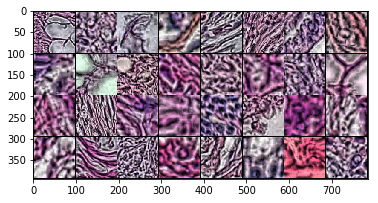

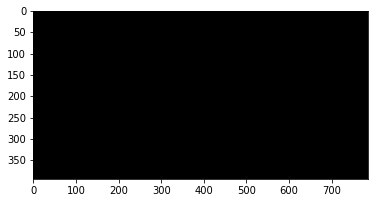

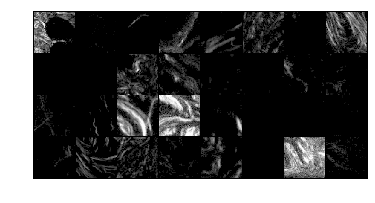

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


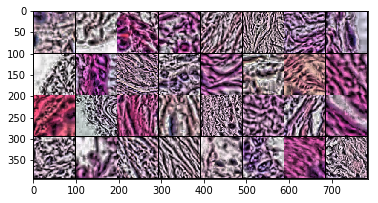

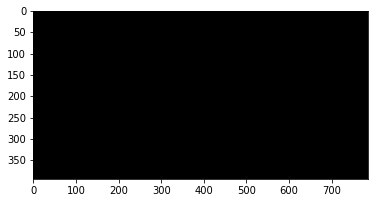

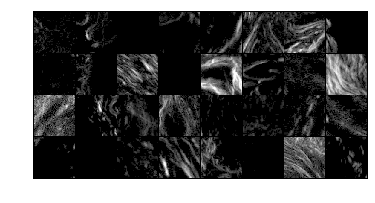

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


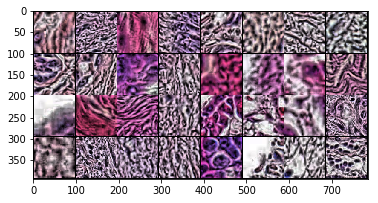

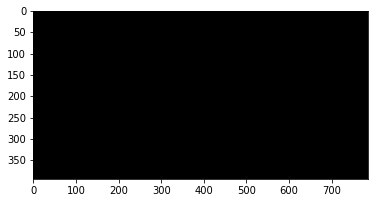

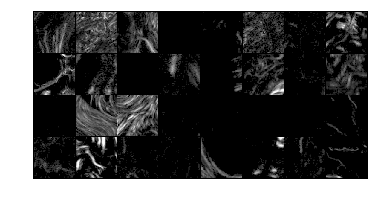

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


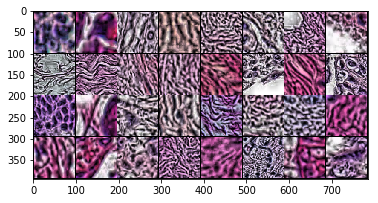

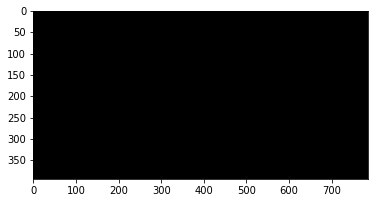

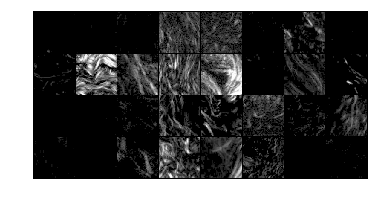

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


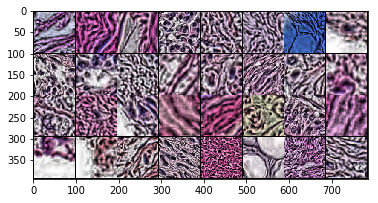

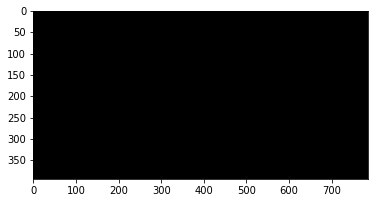

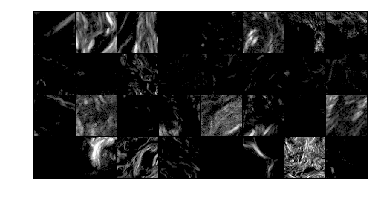

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


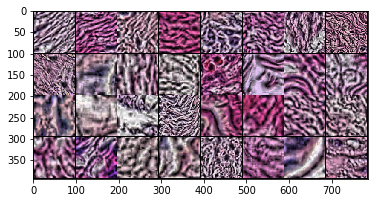

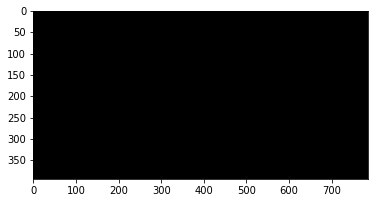

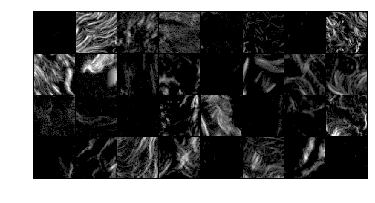

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


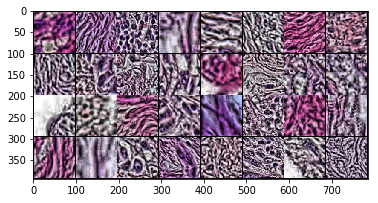

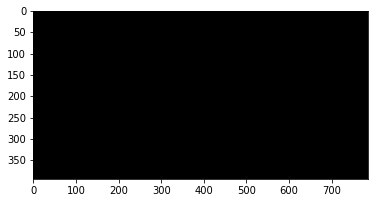

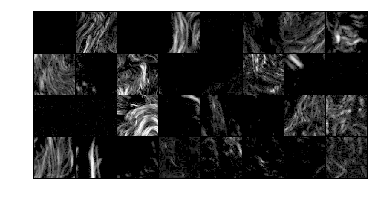

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


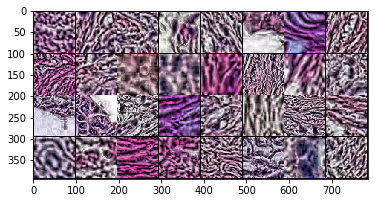

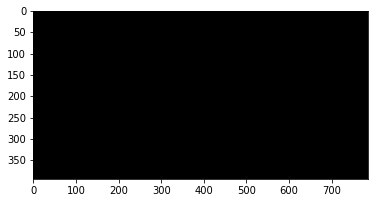

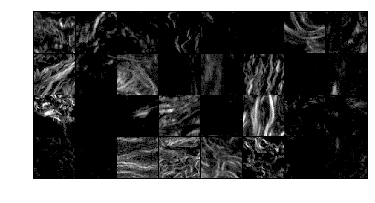

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


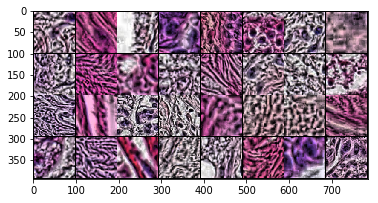

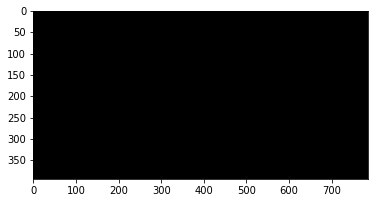

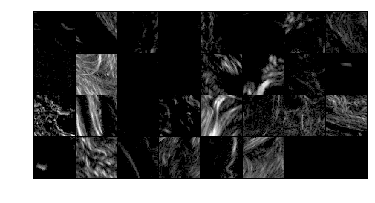

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


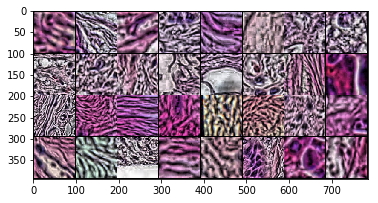

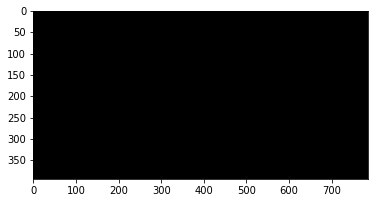

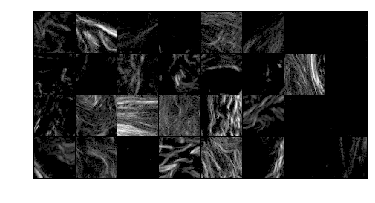

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


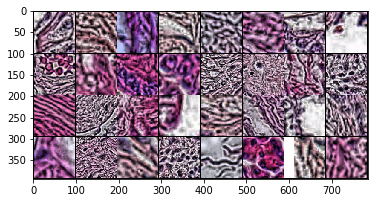

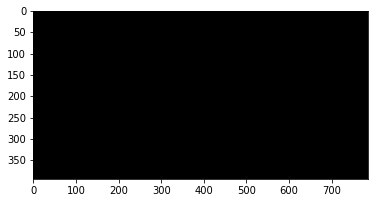

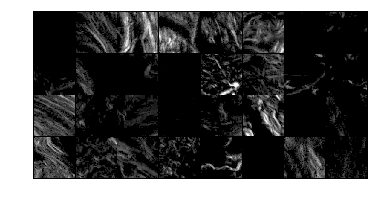

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


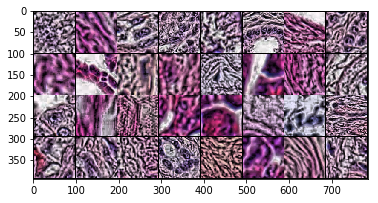

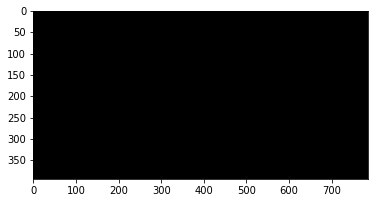

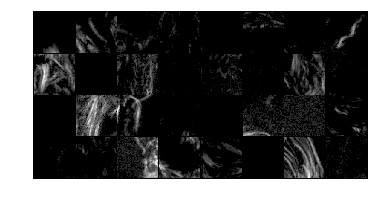

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


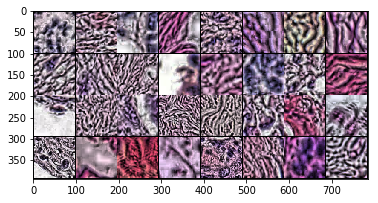

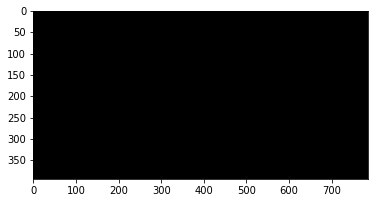

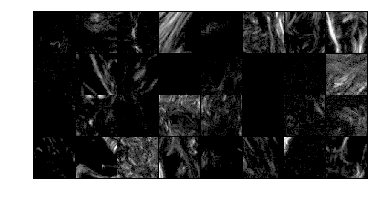

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


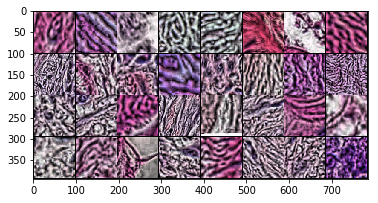

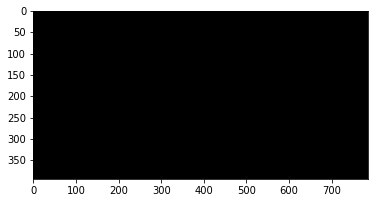

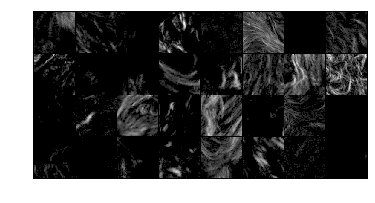

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


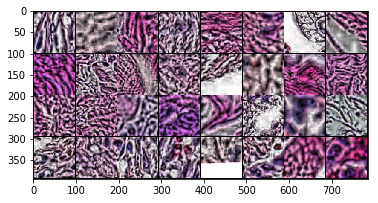

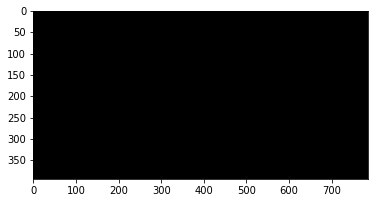

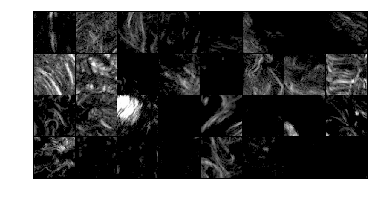

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


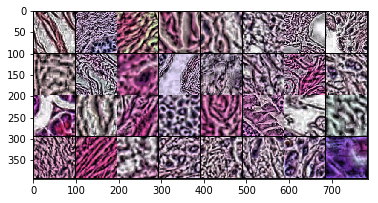

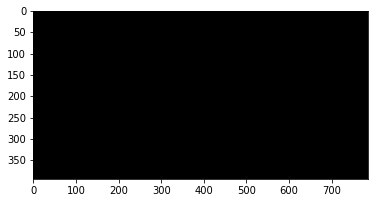

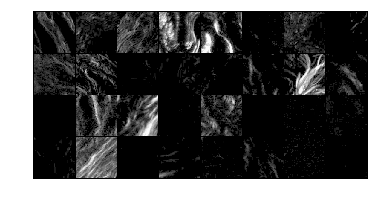

torch.Size([40, 1, 96, 96]) torch.Size([40, 96, 96])
torch.Size([32, 1, 96, 96])


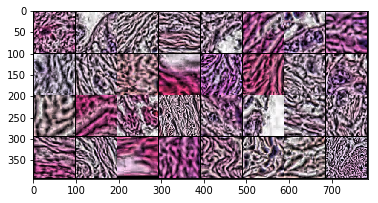

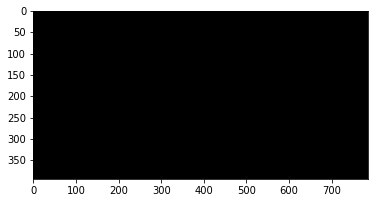

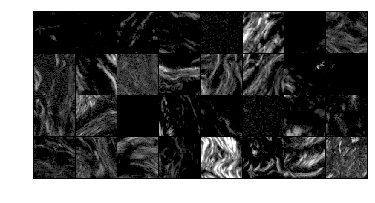

In [12]:
test()